# Assignment 10 - 705.603 - Local Blackjack Optimization 

Additionally, there is a bug in the `watch_trained_agent` function.  The call to `get_action` should not use an epsilon value as there is no need to explore randomly while watching the trained agent.  Added a new function call `watch_trained_agent_no_explore` and you can see the improved function of the test from a rewad of -40 after 100 episodes to a reward of -25.

## Blackjack

### Environment Details

    ### Action Space
    There are two actions: stick (0), and hit (1).
    
    ### Observation Space
    Tuple(Discrete(32), Discrete(11), Discrete(2))
    The observation consists of a 3-tuple containing: 
        1. the player's current sum
        2. the value of the dealer's one showing card (1-10 where 1 is ace)
        3. whether the player holds a usable ace (0 or 1).
        
    ### Rewards
    - win game: +1
    - lose game: -1
    - draw game: 0
    - win game with natural blackjack:
        +1.5 (if natural is True)
        +1 (if natural is False)

## Import libraries and Create Class to Display Cards

In [1]:
from pathlib import Path

import gym
import numpy as np
import random
import matplotlib.pyplot as plt
from IPython import display

from qlearning.lookup_rl import (
    JupyterDisplay,
    get_state_idxs,
    print_policy,
    train_agent,
    update_qtable,
    watch_trained_agent,
    watch_trained_agent_no_exploration,
)


FIGSIZE = (8, 4)
RANDOM_SEED = 777


rl_dir = Path("/rl")
data_dir = rl_dir / "data"
raw_dir = data_dir / "raw"
interim_dir = data_dir / "interim"
processed_dir = data_dir / "processed"
raw_dir.mkdir(exist_ok=True, parents=True)
interim_dir.mkdir(exist_ok=True, parents=True)
processed_dir.mkdir(exist_ok=True, parents=True)
model_path = processed_dir / "local_notebook_model_checkpoint.pth"

## Create Blackjack Environment and test methods

In [2]:
env = gym.make("Blackjack-v1")
env.observation_space

Tuple(Discrete(32), Discrete(11), Discrete(2))

In [3]:
env.action_space

Discrete(2)

In [4]:
env.reset(seed=RANDOM_SEED)

((10, 10, False), {})

## Q-Learning Functions
* Q-learning functions based on the lookup table approach are available in the `lookup_rl` module

## Lookup-table-based Q-learning

### Train the agent

In [5]:
env = gym.make("Blackjack-v1")
env.action_space.seed(RANDOM_SEED)

# get initial state
state = env.reset()

state_size = [x.n for x in env.observation_space]
action_size = env.action_space.n

qtable = np.zeros(state_size + [action_size]) #init with zeros

alpha = 0.3 # learning rate
gamma = 0.1 # discount rate
epsilon = 0.9     # probability that our agent will explore
decay_rate = 0.005

# training variables
num_hands = 500_000

qtable = train_agent(env,
                     qtable,
                     num_hands,
                     alpha,
                     gamma,
                     epsilon,
                     decay_rate)

print(f"Qtable Max: {np.max(qtable)}")
print(f"Qtable Mean: {np.mean(qtable)}")
print(f"Qtable Num Unique Vals: {len(np.unique(qtable))}")


Qtable Max: 1.1111111111110012
Qtable Mean: -0.09088661433549267
Qtable Num Unique Vals: 406


### Observe performance of trained agent in real-time

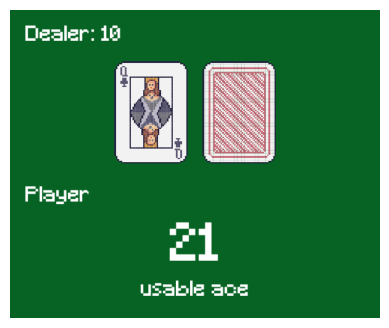

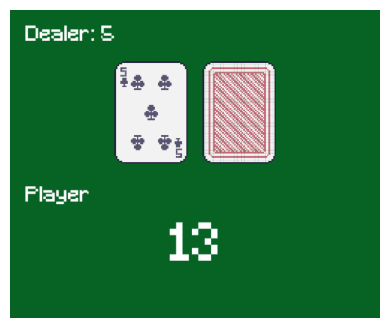

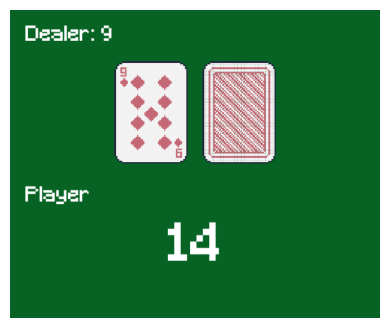

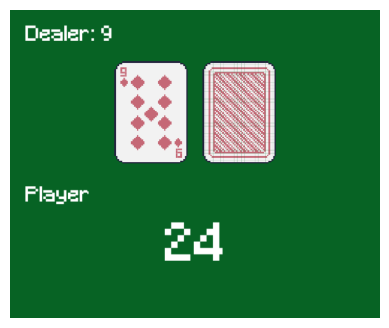

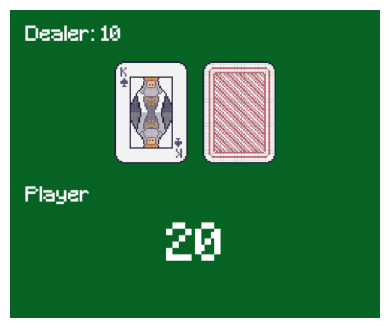

...

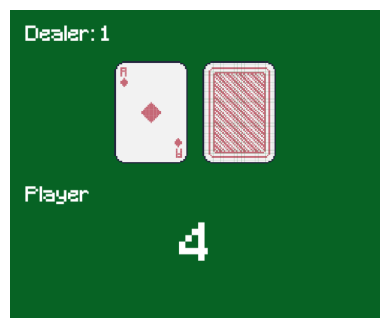

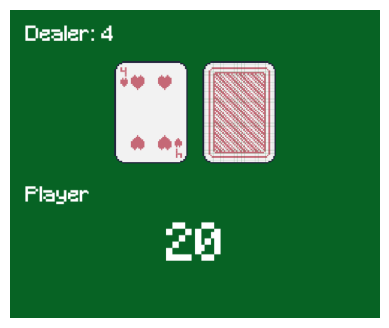

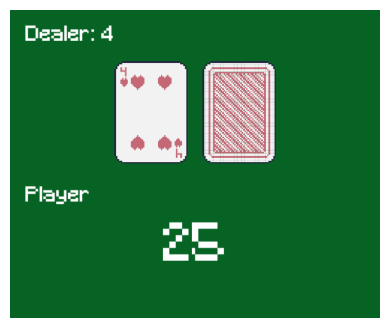

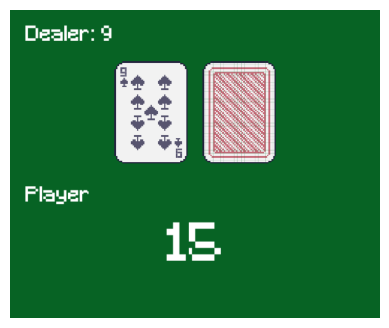

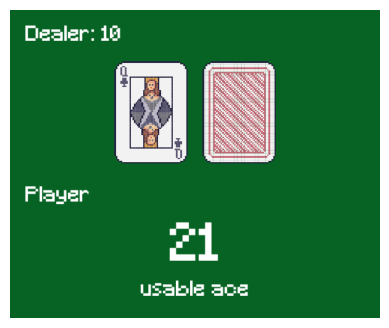

In [6]:
# Watch trained agent
env = gym.make("Blackjack-v1", render_mode='rgb_array')    # Added render mode for compatibility
#env.action_space.seed(42)
rewards = watch_trained_agent(env, qtable, num_rounds=100, epsilon=epsilon, figsize=FIGSIZE)
env.close()

### Display total rewards over time for trained agent

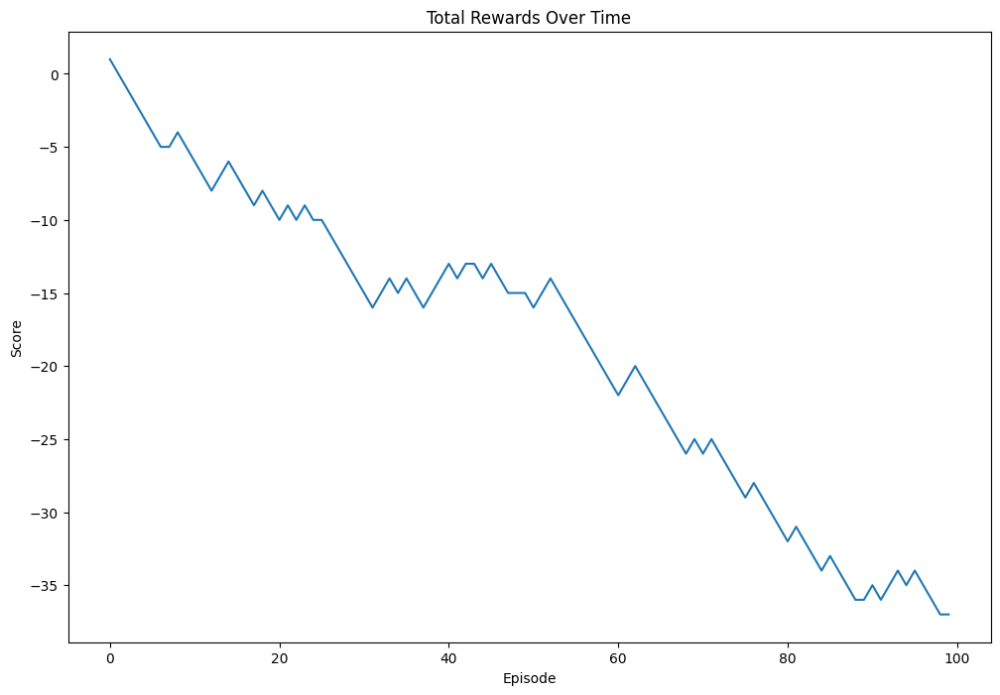

<Figure size 640x480 with 0 Axes>

In [7]:
dst = processed_dir / "local_notebook_lookup_total_rewards_over_time.png"
plt.figure(figsize=(12,8))
plt.plot(np.cumsum(rewards))
plt.ylabel('Score')
plt.xlabel('Episode')
plt.title("Total Rewards Over Time")
plt.show()
plt.savefig(dst)

### Observe performance of trained agent without exploration in real-time

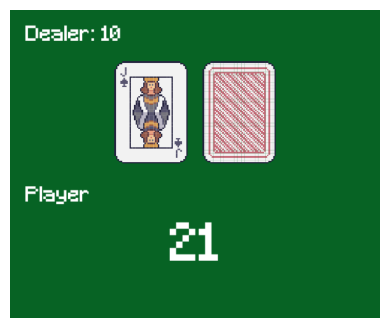

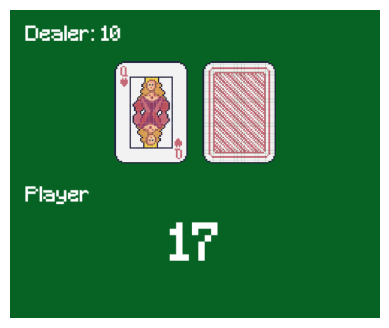

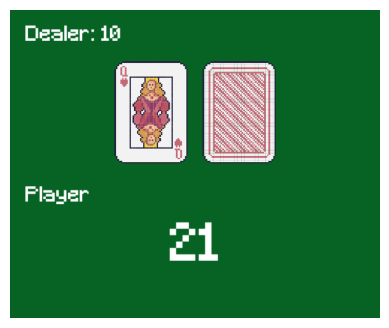

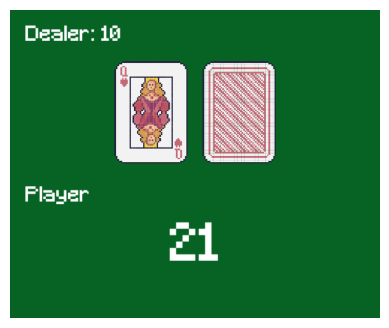

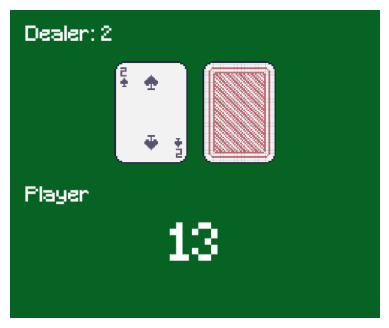

...

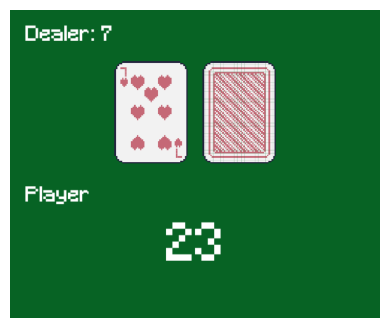

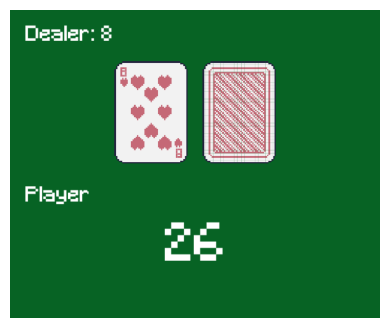

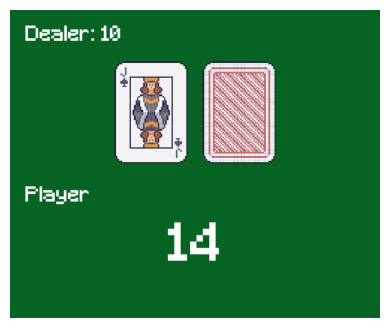

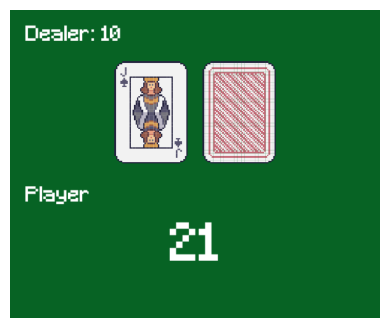

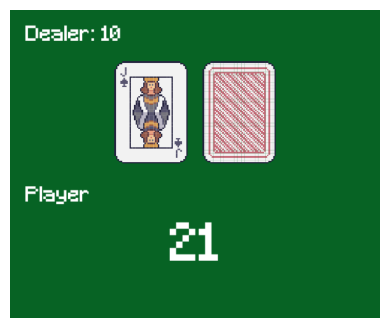

In [8]:
# Watch trained agent
env = gym.make("Blackjack-v1", render_mode='rgb_array')    # Added render mode for compatibility
#env.action_space.seed(42)
rewards = watch_trained_agent_no_exploration(env, qtable, num_rounds=100, epsilon=epsilon, figsize=FIGSIZE)
env.close()

### Display total rewards over time

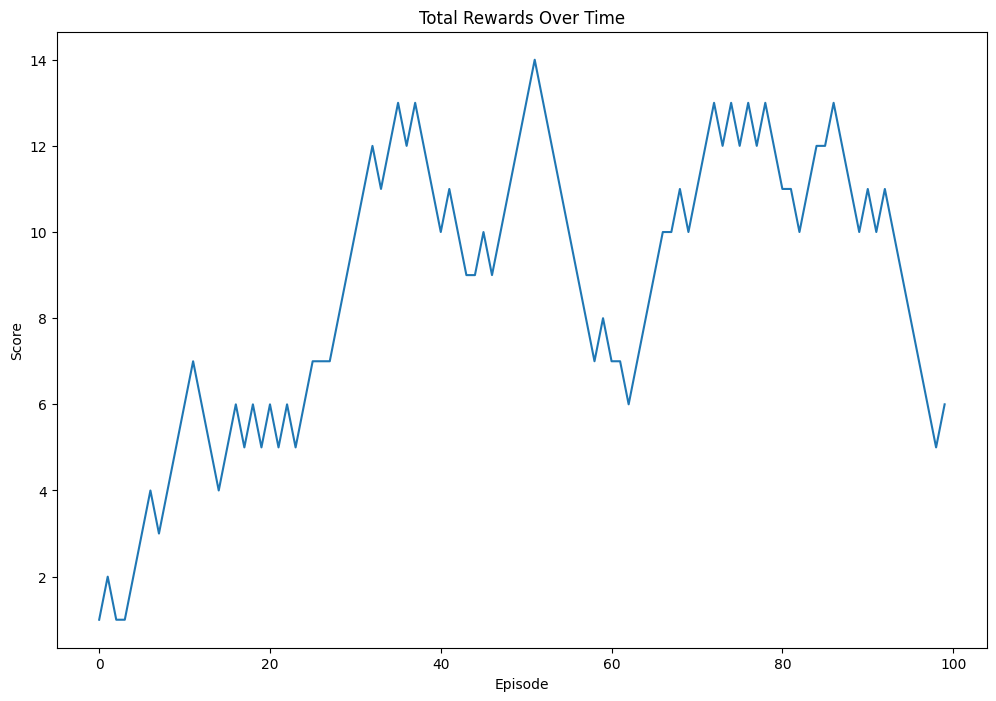

In [9]:
dst = processed_dir / "local_notebook_lookup_total_rewards_over_time_no_exploration.png"
plt.figure(figsize=(12,8))
plt.plot(np.cumsum(rewards))
plt.ylabel('Score')
plt.xlabel('Episode')
plt.title("Total Rewards Over Time")
plt.show()

# DRL Blackjack
* Deep reinforcement learning classes and functions are provided in the `qlearning` module.

## Import libraries

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from qlearning import Agent, Experience, QNetwork, ReplayBuffer, dqn

## Set Params

In [11]:
BUFFER_SIZE = int(1e3)  # replay buffer size
BATCH_SIZE = 64         # minibatch size
GAMMA = 0.99            # discount factor
TAU = 1e-3              # for soft update of target parameters
LR = 3e-4               # learning rate 
UPDATE_EVERY = 4        # how often to update the network
N_EPISODES = 70_000

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cpu


## Train

In [12]:
env = gym.make("Blackjack-v1")
env.action_space.seed(42)

agent = Agent(
    state_size=3,
    action_size=2,
    lr=LR,
    gamma=GAMMA,
    tau=TAU,
    buffer_size=BUFFER_SIZE,
    batch_size=BATCH_SIZE,
    update_every=UPDATE_EVERY,
    seed=0,
    device=device,
)
scores = dqn(agent, model_path, env, n_episodes=N_EPISODES)

Episode 5000	Average Score: 0.010
Episode 10000	Average Score: 0.00
Episode 15000	Average Score: -0.01
Episode 20000	Average Score: -0.01
Episode 25000	Average Score: -0.00
Episode 30000	Average Score: -0.01
Episode 35000	Average Score: 0.000
Episode 40000	Average Score: -0.01
Episode 45000	Average Score: -0.01
Episode 50000	Average Score: 0.010
Episode 55000	Average Score: -0.02
Episode 60000	Average Score: 0.011
Episode 65000	Average Score: 0.011
Episode 70000	Average Score: -0.01


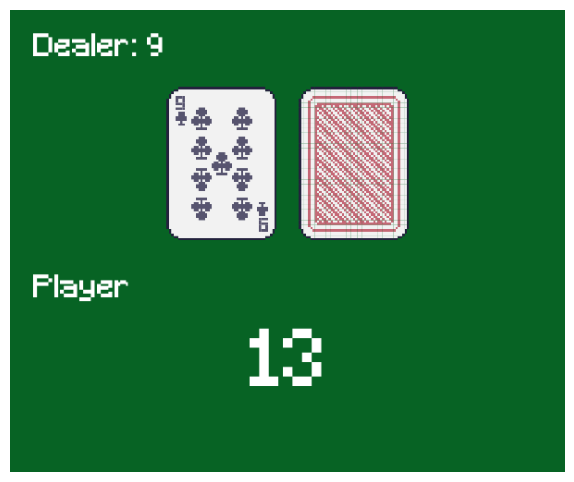

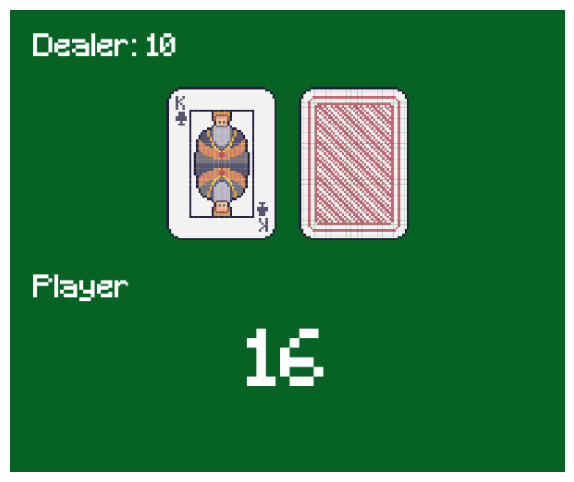

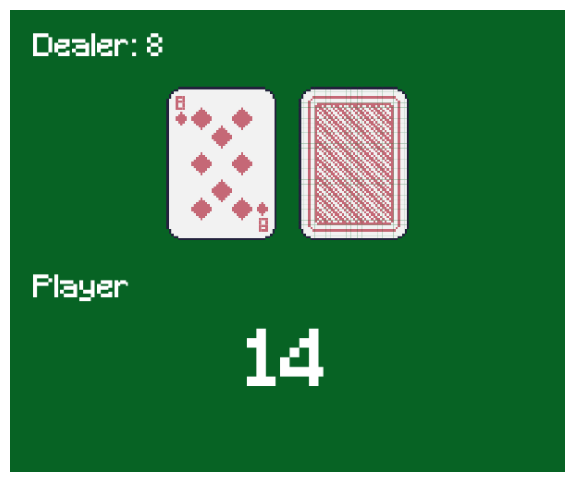

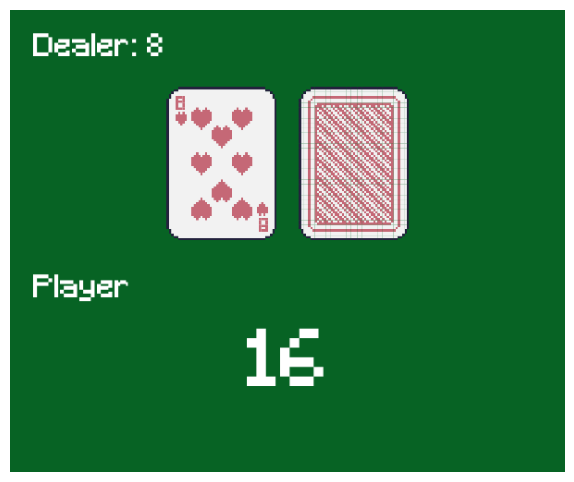

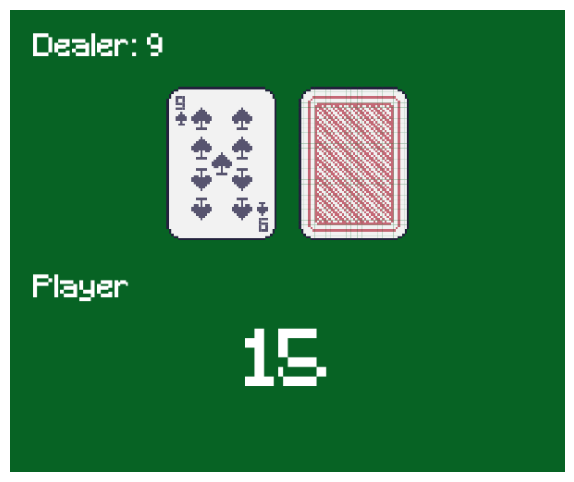

...

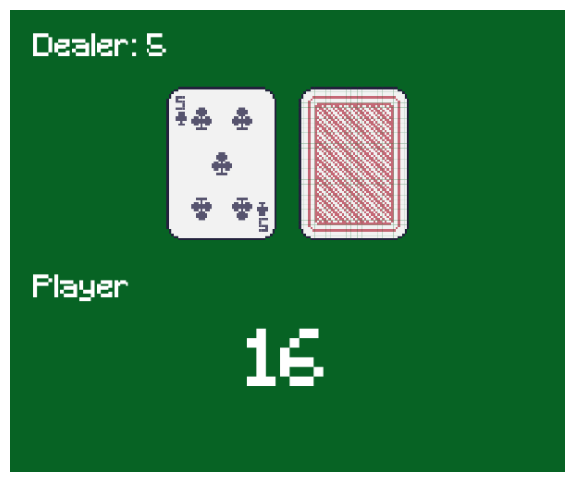

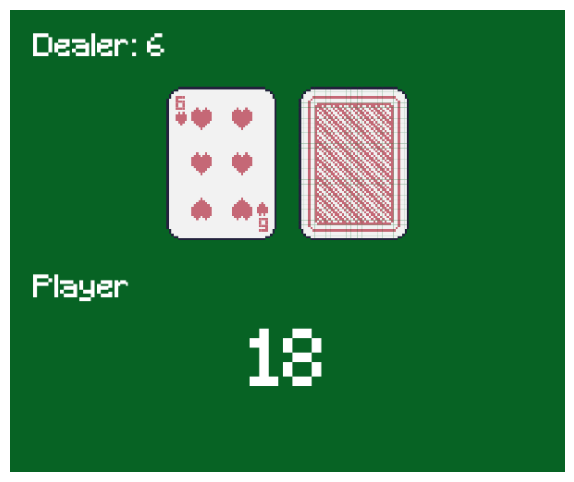

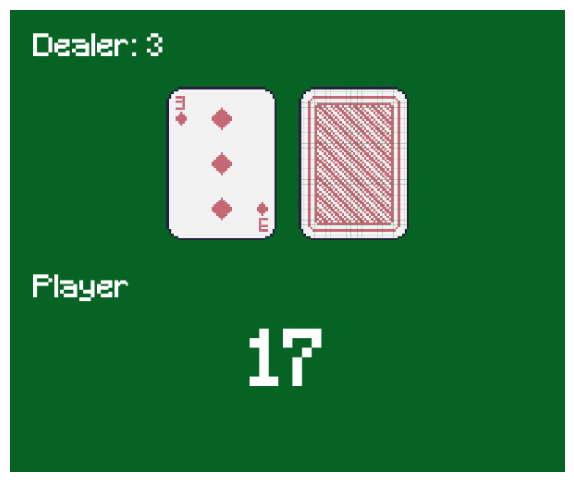

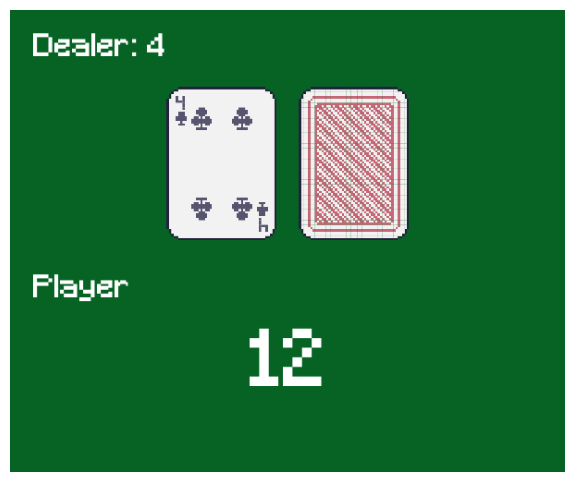

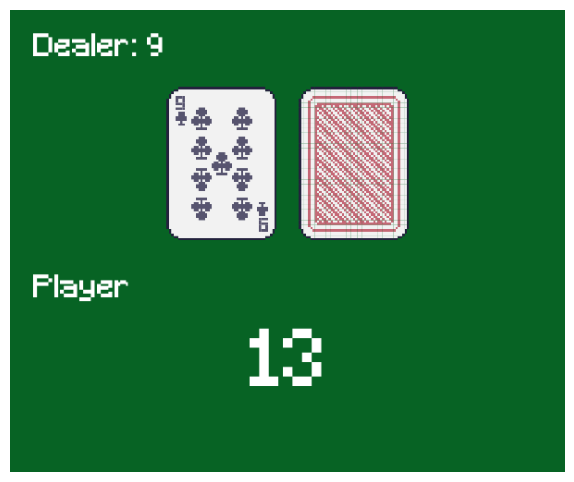

In [13]:
env = gym.make("Blackjack-v1", render_mode='rgb_array')    # Added render mode for compatibility
envdisplay = JupyterDisplay(env, figsize=(10,6))

num_hands = 100

agent.qnetwork_local.load_state_dict(torch.load(model_path))

results = []
for hand in range(num_hands):
    state, _ = env.reset()                                   # Added _ for new version of gym
    state = np.array(get_state_idxs(state), dtype=float)
    state[0] = state[0]/32
    state[1] = state[1]/10

    done = False
    while not done:
        frame = env.render()        
        action = agent.act(state)
        if isinstance(action, tuple):
            action, value = action
        else:
            value = 1.

        state, reward, done, _, _ = env.step(action)         # Added second _ for new version of gym
        reward *= value
        state = np.array(get_state_idxs(state), dtype=float)
        state[0] = state[0]/32
        state[1] = state[1]/10

    envdisplay.show(env)
    results.append(reward)

env.close()


## Display scores

### Batting average

In [14]:
batting_avg = np.argwhere(np.array(results) > 0).size / len(results)
print(f"Batting Average: {batting_avg*100:.2f}%")

Batting Average: 54.00%


### Rewards over time

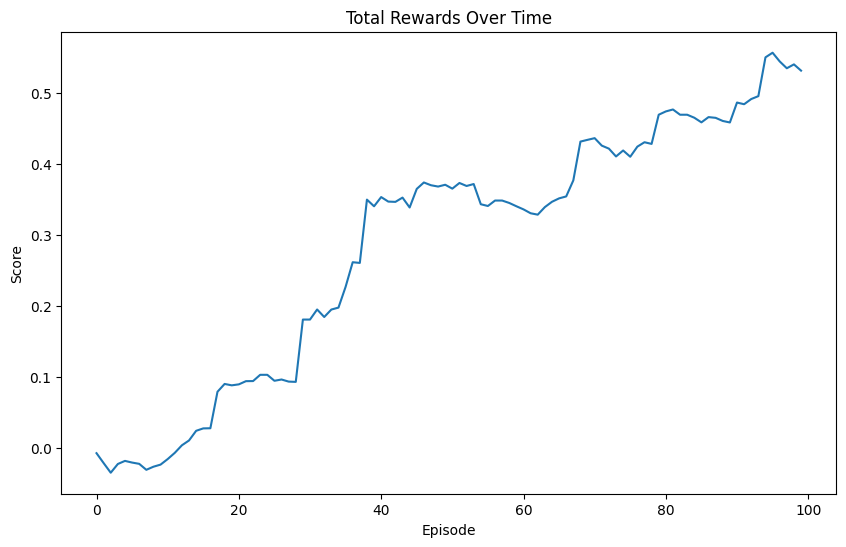

<Figure size 640x480 with 0 Axes>

In [15]:
dst = processed_dir / "local_notebook_rewards_over_time.png"
plt.figure(figsize=(10,6))
plt.plot(np.cumsum(results))
plt.ylabel('Score')
plt.xlabel('Episode')
plt.title("Total Rewards Over Time")
plt.show()
plt.savefig(dst)


### Total cash over time

Percent Gain: 531.66%


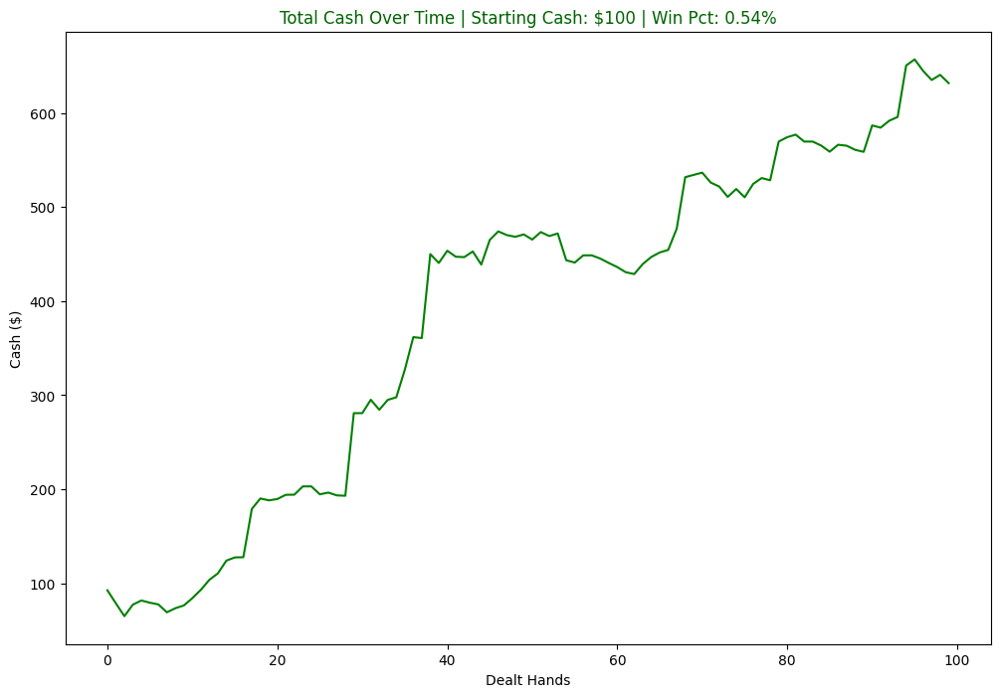

<Figure size 640x480 with 0 Axes>

In [16]:
dst = processed_dir / "local_notebook_total_cash_over_time.png"
start_cash = 100.
pct_gain = ((start_cash + np.sum(results)*1000) - 100) / 100
print(f"Percent Gain: {pct_gain*100:.2f}%")
plt.figure(figsize=(12,8))
plt.plot(start_cash + np.cumsum(results)*1000, c="g")
plt.ylabel("Cash ($)")
plt.xlabel("Dealt Hands")
plt.title(f"Total Cash Over Time | Starting Cash: ${int(start_cash)} | Win Pct: {batting_avg:.2f}%", c="darkgreen")
plt.show()
plt.savefig(dst)